In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats

DATASET_LOCATION = "../datasets/large-imc21"

In [2]:
bw_3mon_df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BW_THREE_MONTHS.csv", nrows=10)
bw_df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH.csv", nrows=10)

print(bw_3mon_df.columns)
print(bw_df.columns)

Index(['vm_id', 'report_time', 'pub_down_bw', 'pub_up_bw', 'pri_down_bw',
       'pri_up_bw'],
      dtype='object')
Index(['vm_id', 'site_id', 'pub_down_flow', 'pub_up_flow', 'pub_down_bw',
       'pub_up_bw', 'pri_down_flow', 'pri_up_flow', 'pri_down_bw', 'pri_up_bw',
       'report_ts'],
      dtype='object')


In [3]:
# Run scripts/split_large_bw.py first
# Using the 1-month dataset for each city as it contains number of flows
bw_shanghai_df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH_SHANGHAI.csv")
print(len(bw_shanghai_df))
print(bw_shanghai_df.columns)

4440653
Index(['vm_id', 'site_id', 'pub_down_flow', 'pub_up_flow', 'pub_down_bw',
       'pub_up_bw', 'pri_down_flow', 'pri_up_flow', 'pri_down_bw', 'pri_up_bw',
       'report_ts'],
      dtype='object')


In [4]:
print(pd.to_datetime(min(bw_shanghai_df['report_ts']), unit='s'))
print(pd.to_datetime(max(bw_shanghai_df['report_ts']), unit='s'))

2020-05-31 16:00:00
2020-06-30 15:55:00


In [5]:
print(bw_shanghai_df.head())
print(bw_shanghai_df.tail())

                              vm_id             site_id  pub_down_flow  \
0  8c3f09d8ceb9c8e4c6804efcd2aef345       shanghai-cmcc      246990071   
1  92436927daf5c7535c3a4c066186d5e2  shanghai-telecom-6       10143155   
2  cb68bf3be362a806975fbcfbe050669d  shanghai-telecom-5         274059   
3  7eac7c4f1986d2e34c20a9b25e79fc26      shanghai-other       82793805   
4  e54656e2f14a1c116fb0c9b08b4e9fca       shanghai-cmcc      244606002   

   pub_up_flow  pub_down_bw  pub_up_bw  pri_down_flow  pri_up_flow  \
0    271063256      6586401    7228353            140            0   
1     12322202       270484     328592              0            0   
2       273331         7308       7288         126371       159617   
3   2056008743      2207834   54826899    23209712915  25257218805   
4    265214256      6522826    7072380             70            0   

   pri_down_bw  pri_up_bw   report_ts  
0            3          0  1593286200  
1            0          0  1593286200  
2         3369

In [6]:
bw_shanghai_df.sort_values(by='report_ts', inplace=True)

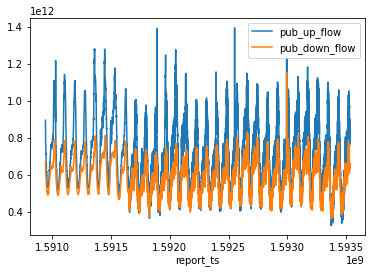

In [7]:
bw_shanghai_df.groupby('report_ts').pub_up_flow.sum().plot(label='pub_up_flow')
bw_shanghai_df.groupby('report_ts').pub_down_flow.sum().plot(label='pub_down_flow')
plt.legend()

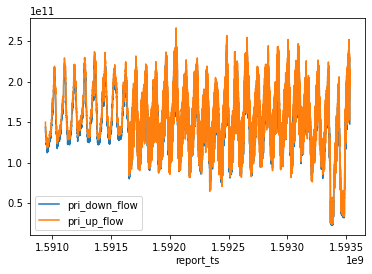

In [8]:
bw_shanghai_df.groupby('report_ts').pri_down_flow.sum().plot(label='pri_down_flow')
bw_shanghai_df.groupby('report_ts').pri_up_flow.sum().plot(label='pri_up_flow')
plt.legend()

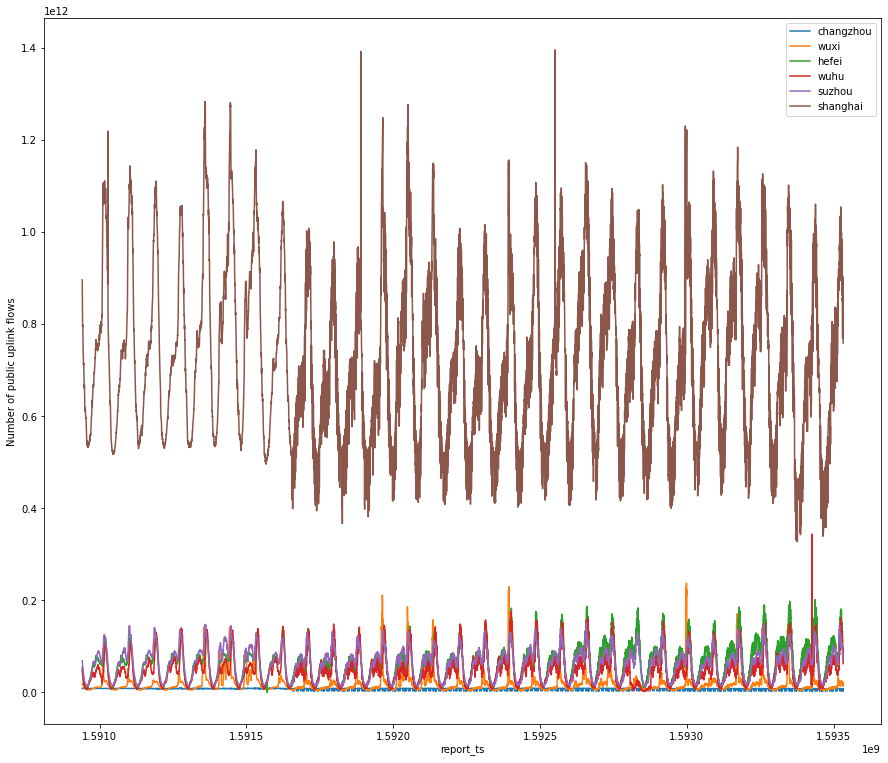

In [9]:
cities = ["changzhou", "wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

fig,ax = plt.subplots(figsize=(15,13))
for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    df.groupby('report_ts').pub_up_flow.sum().plot(ax=ax, label=city)

plt.ylabel("Number of public uplink flows")
plt.legend()

# Also plot CPU utilization - number of cores requested divided by total capacity


In [4]:
# Identify computational capabilities of each site (PMs)
pm_df = pd.read_csv(DATASET_LOCATION + "/PM.csv")
pm_ids_to_delete = []
for city in cities:
    city_df = pm_df.loc[pm_df["site_id"].str.startswith(city)]
    pm_ids_to_delete.extend(city_df[city_df.cores == 0].pm_name.to_list())
    city_df = city_df[city_df.cores != 0] # Remove PMs with only storage

    print("{}, num_machines = {}, num_cores = {}, memory = {}, storage = {}, sites = {}".format(city,
                                                                                    len(city_df),
                                                                                    city_df.cores.sum(),
                                                                                    city_df.memory.sum(),
                                                                                    city_df.storage.sum(),
                                                                                    sorted(city_df.site_id.unique())))

changzhou, num_machines = 10, num_cores = 672, memory = 5154820, storage = 197569463, sites = ['changzhou-telecom']
wuxi, num_machines = 33, num_cores = 3604, memory = 12908230, storage = 283243905, sites = ['wuxi-telecom-2', 'wuxi-telecom_unicom_cmcc']
hefei, num_machines = 12, num_cores = 961, memory = 3607192, storage = 10813450, sites = ['hefei-cmcc']
wuhu, num_machines = 21, num_cores = 1647, memory = 6570353, storage = 187928088, sites = ['wuhu-telecom', 'wuhu-unicom']
suzhou, num_machines = 42, num_cores = 3279, memory = 14946545, storage = 199260775, sites = ['suzhou-telecom', 'suzhou-telecom-2', 'suzhou-telecom-3']
shanghai, num_machines = 161, num_cores = 14958, memory = 70541096, storage = 2602798144, sites = ['shanghai-cmcc', 'shanghai-cmcc-2', 'shanghai-other', 'shanghai-telecom', 'shanghai-telecom-2', 'shanghai-telecom-3', 'shanghai-telecom-4', 'shanghai-telecom-5', 'shanghai-telecom-6', 'shanghai-unicom', 'shanghai-unicom-2']


In [5]:
print(pm_ids_to_delete)
pm_df_delete = pm_df[pm_df['pm_name'].isin(pm_ids_to_delete)]
print(pm_df_delete)

['5a01eb6f91330e31828c45a54d2bbf47', '621e75b069861207b9bf7205bb671891', 'cd4b5da461d1814966d61fb1fe8c32de', '5856c35f6c497888c7c5f4ae4108f695', '7a443dca567e517d74dc168e26e8b0b4', 'e5b6f9e555c8c19c649c97a2634634dc', 'a7602b315788aba4d4ba215bbce698e2', 'c3d91b238edfef1a633b47e4c478432b']
                               pm_name             site_id  cores  memory  \
1939  e5b6f9e555c8c19c649c97a2634634dc  shanghai-telecom-5      0       0   
2052  a7602b315788aba4d4ba215bbce698e2     shanghai-unicom      0       0   
2053  621e75b069861207b9bf7205bb671891        wuhu-telecom      0       0   
2080  c3d91b238edfef1a633b47e4c478432b  shanghai-telecom-5      0       0   
2201  5a01eb6f91330e31828c45a54d2bbf47      wuxi-telecom-2      0       0   
2226  5856c35f6c497888c7c5f4ae4108f695    suzhou-telecom-2      0       0   
2227  7a443dca567e517d74dc168e26e8b0b4    suzhou-telecom-2      0       0   
2230  cd4b5da461d1814966d61fb1fe8c32de        wuhu-telecom      0       0   

       storage  


['changzhou-telecom']
['wuxi-telecom-2', 'wuxi-telecom_unicom_cmcc']
['hefei-cmcc']
['wuhu-telecom', 'wuhu-unicom']
['suzhou-telecom', 'suzhou-telecom-2', 'suzhou-telecom-3']
['shanghai-cmcc', 'shanghai-cmcc-2', 'shanghai-other', 'shanghai-telecom', 'shanghai-telecom-2', 'shanghai-telecom-3', 'shanghai-telecom-4', 'shanghai-telecom-5', 'shanghai-telecom-6', 'shanghai-unicom', 'shanghai-unicom-2']


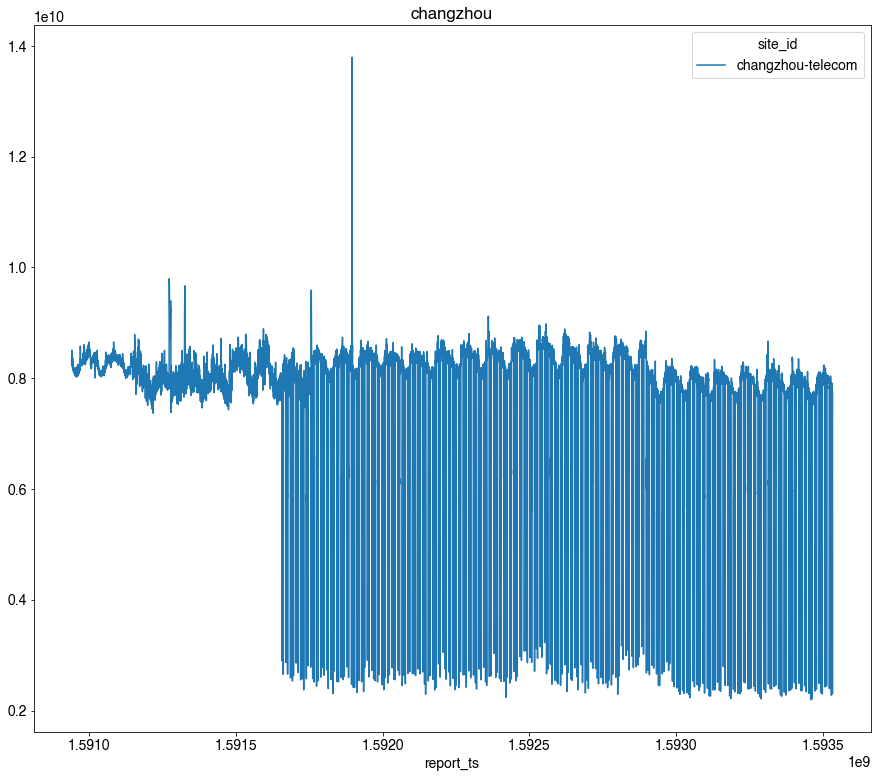

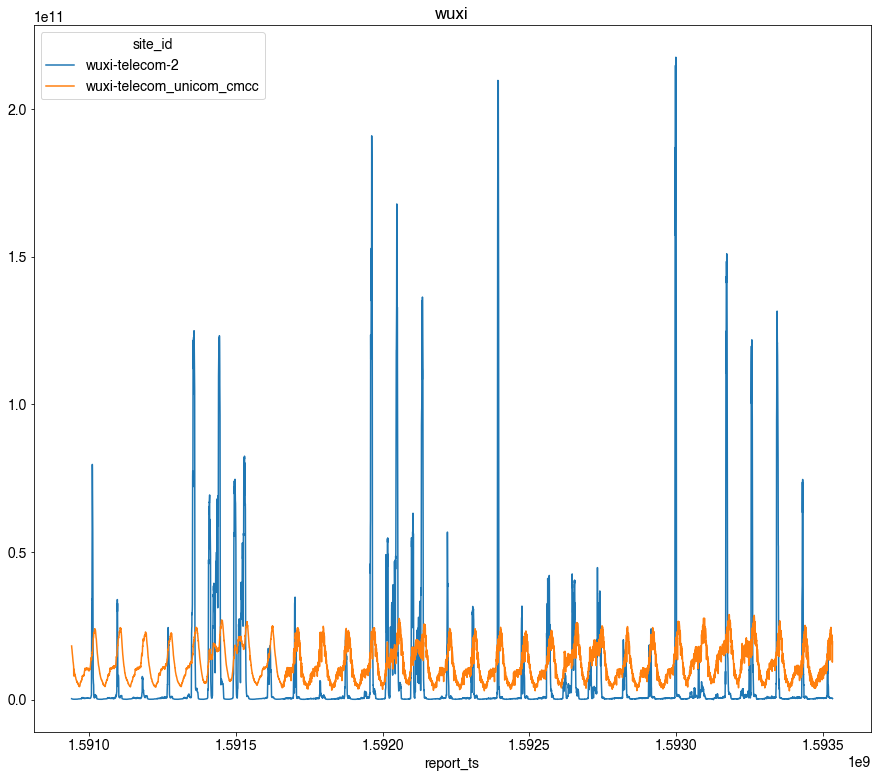

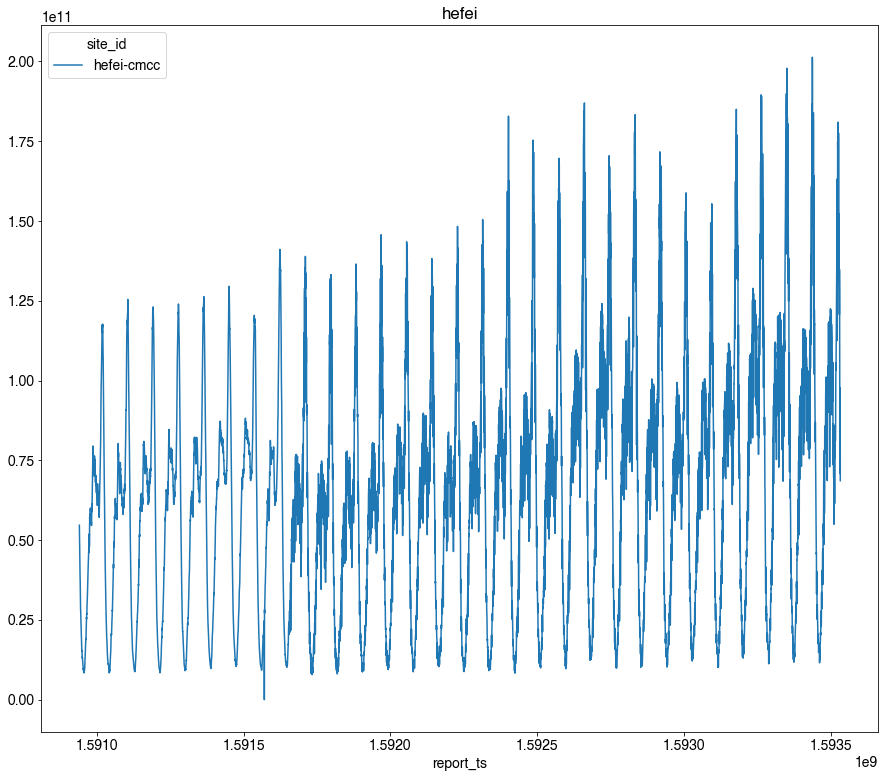

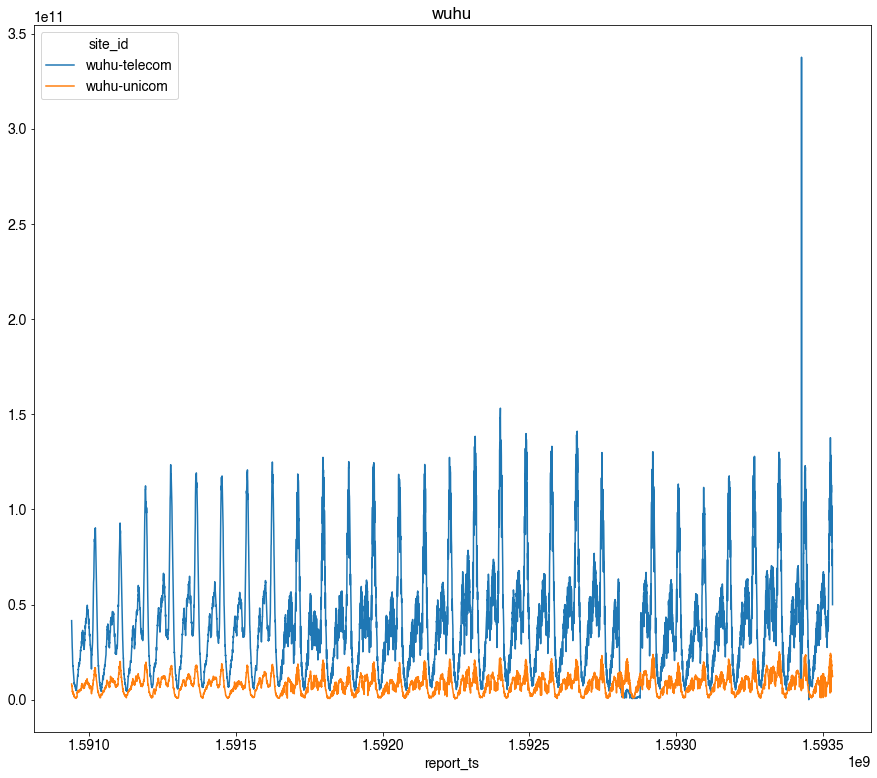

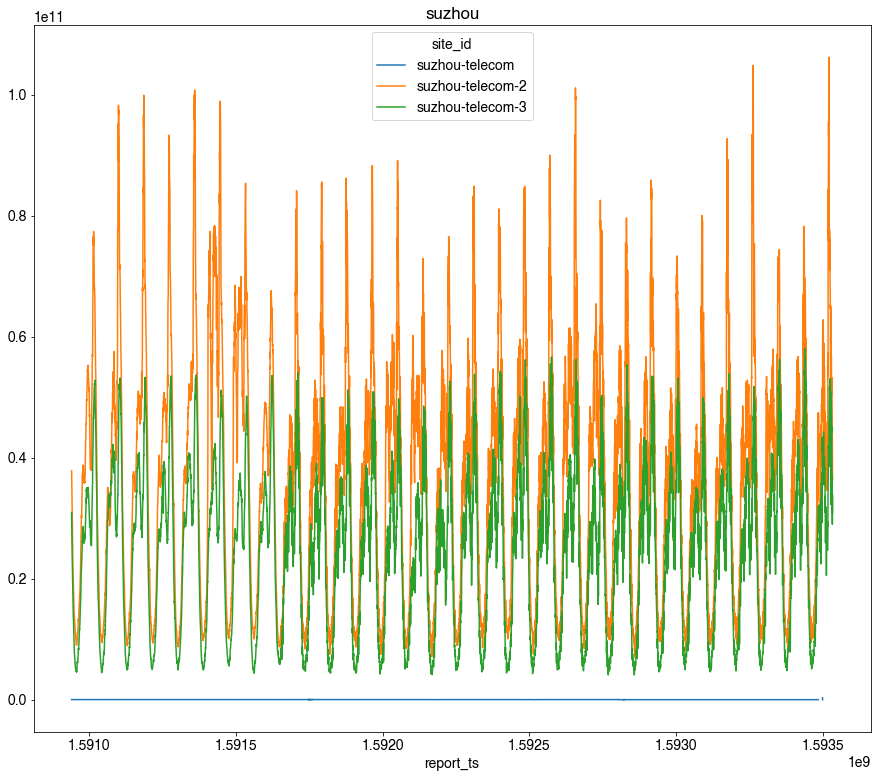

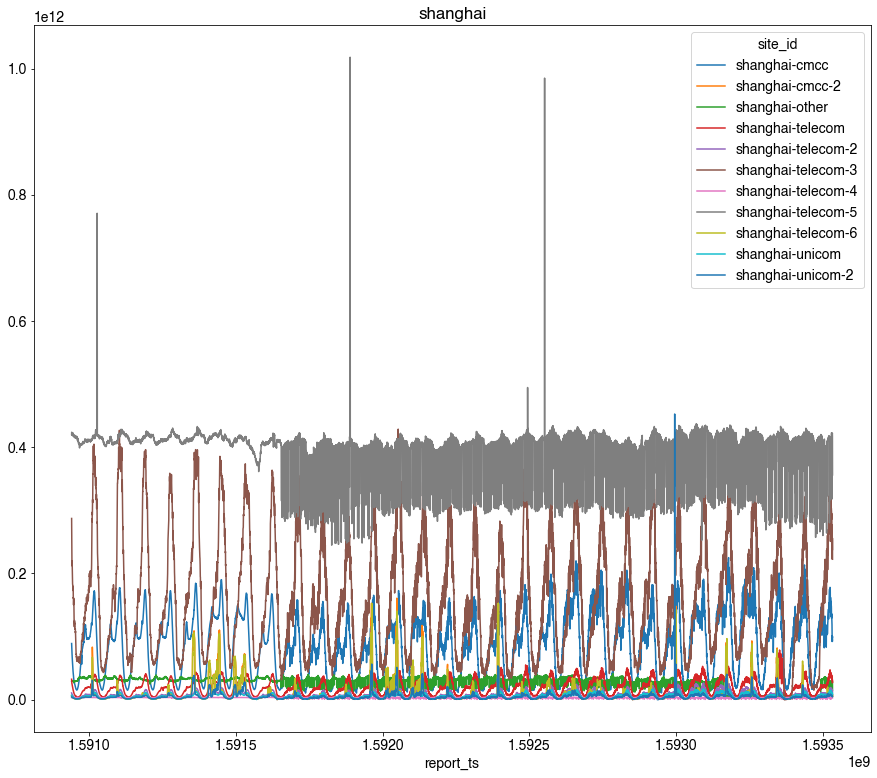

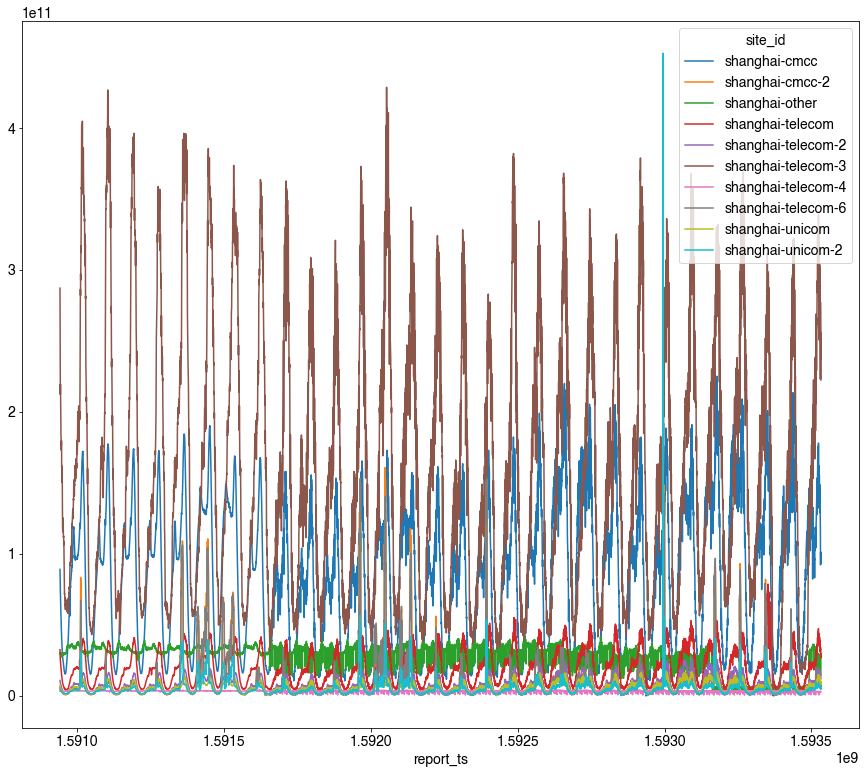

In [23]:

cities = ["changzhou", "wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    #print(df.groupby(["report_ts", "site_id"]).pub_up_flow.sum())#.plot(ax=ax)
    new_df = df.groupby(["report_ts", "site_id"]).pub_up_flow.sum().unstack()
    column_names = new_df.columns.tolist()
    print(column_names)
    #fig,ax = plt.subplots(figsize=(15,13))
    new_df.plot.line(figsize=(15,13), title=city)

    if city == "shanghai":
        column_names.remove("shanghai-telecom-5")
        new_df[column_names].plot.line(figsize=(15,13))

    #df.groupby('report_ts').pub_up_flow.sum().plot(ax=ax, label=city)



In [17]:
def plot_cdf_per_site(vals, site_ids, title):
    plt.rcParams.update({'font.family': 'sans-serif'})
    plt.rcParams.update({'font.sans-serif': 'Helvetica'})
    plt.rcParams.update({'font.size': 14})
    fig, ax = plt.subplots(figsize=(15,13))
    for site_name in site_ids:
        plot_values = vals[site_name].copy()
        plot_values = sorted(plot_values)
        y_vals = np.arange(len(plot_values))/float(len(plot_values)-1)
        plt.plot(plot_values, y_vals, label=site_name)

    plt.yticks(ticks=np.arange(0, 1.1, 0.1))
    plt.grid(alpha=0.7, linestyle=':')
    plt.legend()
    plt.ylabel("Cumulative probability")
    plt.xlabel("CPU utilization")
    plt.title(title)
    fig.tight_layout()

    plt.show()
    #plt.savefig(filename, dpi=600)
    #plt.cla()
    #plt.close(fig)

wuxi 148
hefei 52
wuhu 106
suzhou 207
shanghai 587


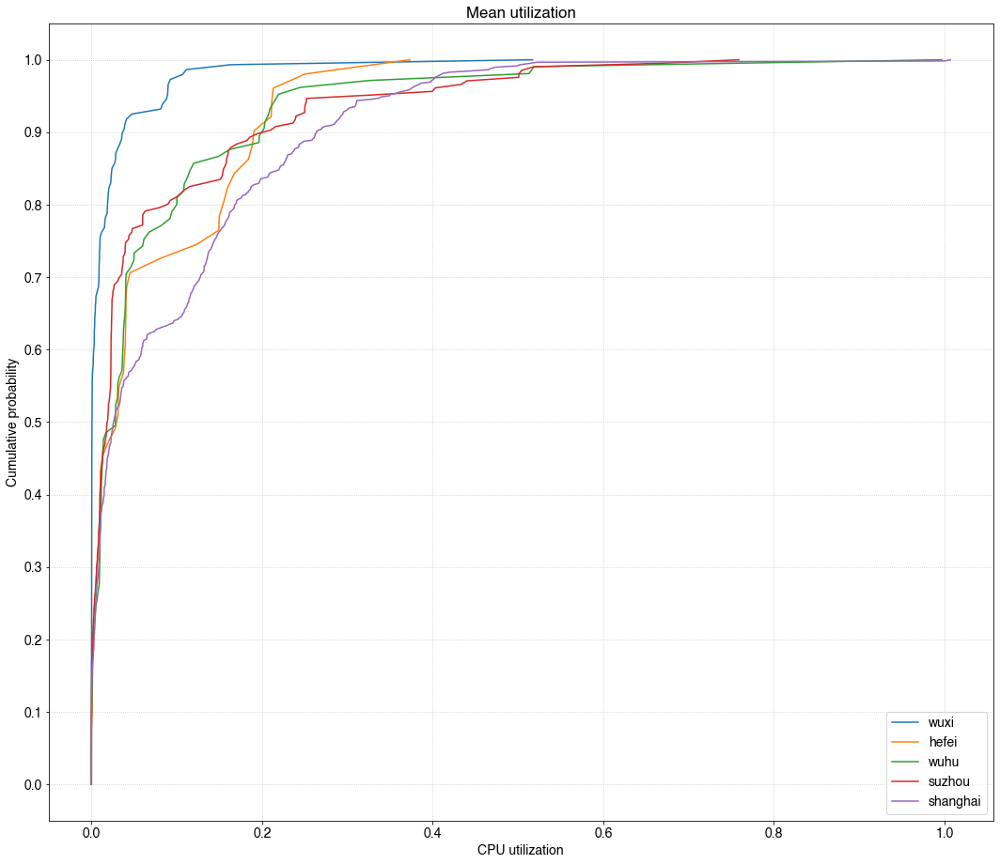

In [18]:
# Analyze CPU utilization of all VMs in Shanghai region

# group by VM ID - calculate average, median and P95 utilization
# Validate number of VMs per region match what is in VM.csv?
# group by VM ID, per day - calculate average, median and P95 utilization per VM-day?
cities = ["wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

# Removing changhzhou as only 8 VMs are deployed
cpu_vals = {}
for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_CPU_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    #print(df.groupby(["report_ts", "site_id"]).pub_up_flow.sum())#.plot(ax=ax)
    cpu_vals[city] = df.groupby(["vm_id"]).cpu_rate.mean().tolist()
    print(city, len(cpu_vals[city]))

plot_cdf_per_site(cpu_vals, cities, "Mean utilization")

wuxi 148
hefei 52
wuhu 106
suzhou 207
shanghai 587


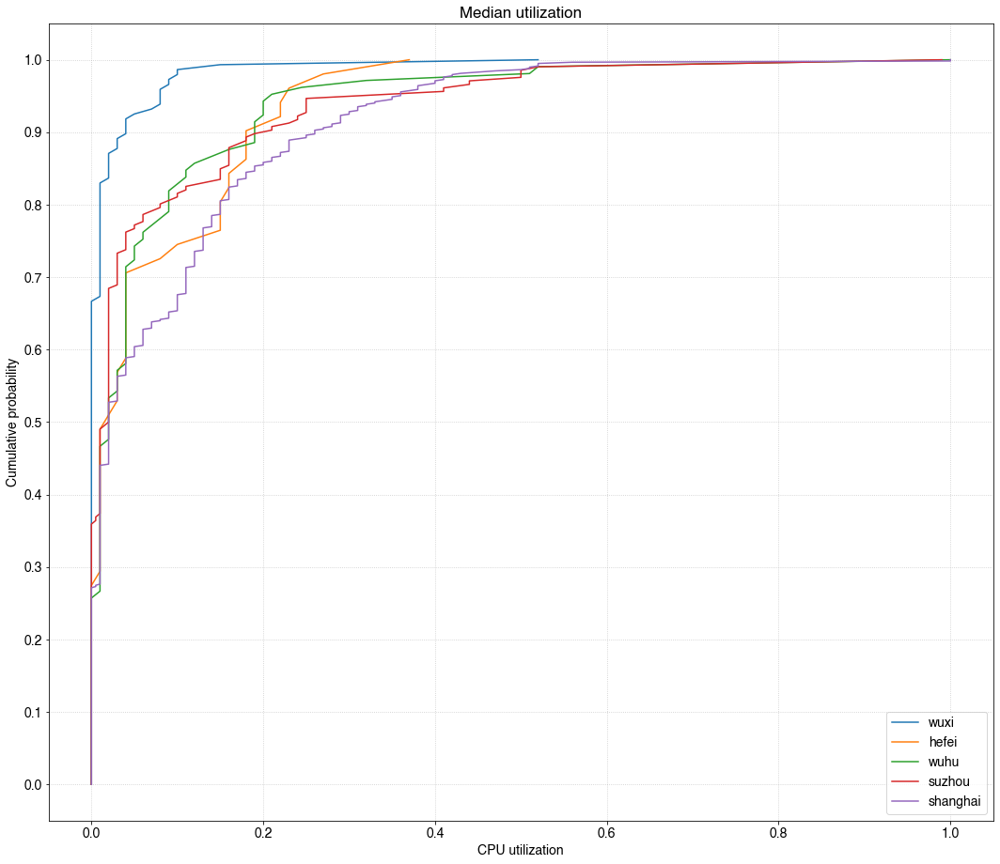

In [19]:
cities = ["wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

# Removing changhzhou as only 8 VMs are deployed
cpu_vals = {}
for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_CPU_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    #print(df.groupby(["report_ts", "site_id"]).pub_up_flow.sum())#.plot(ax=ax)
    cpu_vals[city] = df.groupby(["vm_id"]).cpu_rate.median().tolist()
    print(city, len(cpu_vals[city]))

plot_cdf_per_site(cpu_vals, cities, "Median utilization")

wuxi 148
hefei 52
wuhu 106
suzhou 207
shanghai 587


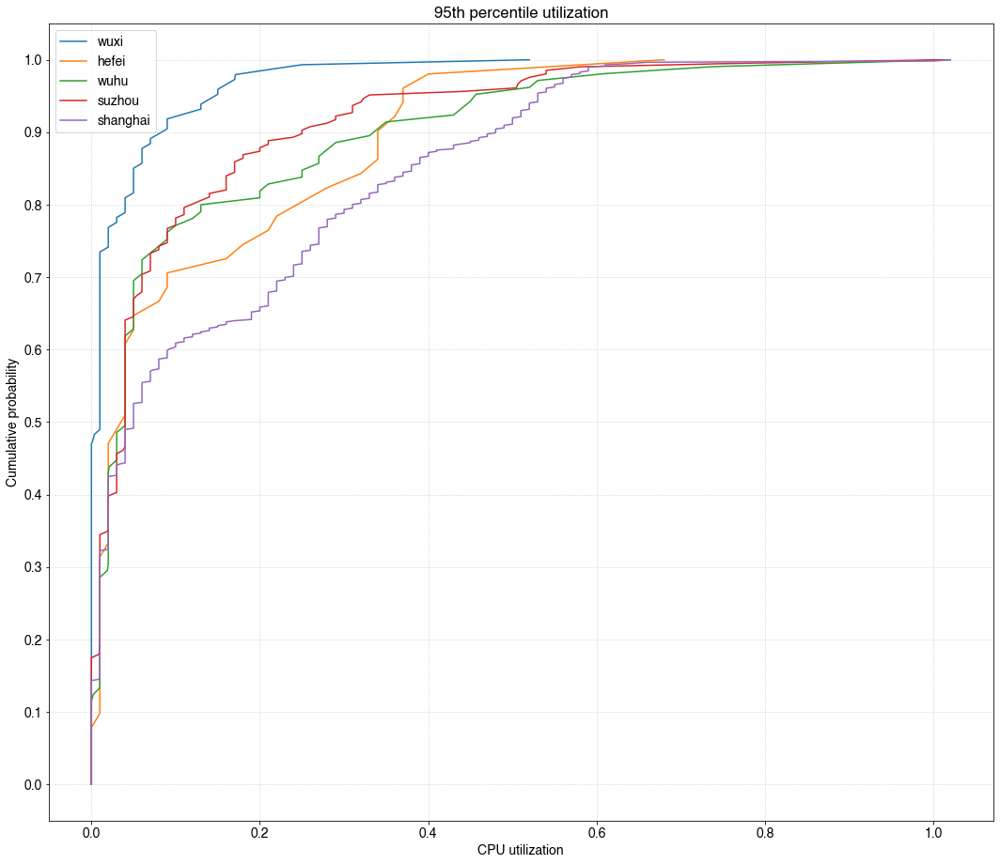

In [20]:
cities = ["wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

# Removing changhzhou as only 8 VMs are deployed
cpu_vals = {}
for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_CPU_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    #print(df.groupby(["report_ts", "site_id"]).pub_up_flow.sum())#.plot(ax=ax)
    cpu_vals[city] = df.groupby(["vm_id"]).cpu_rate.quantile(0.95).tolist()
    print(city, len(cpu_vals[city]))

plot_cdf_per_site(cpu_vals, cities, "95th percentile utilization")

pm_name
3bca3bba66aebf90ba313f50ec88742a    9.572266e-07
ee6e30b8ab48a550a15c6b95fd5ae0b8    1.224549e-06
25e08d216d924ed47d845a5bbcb1b02a    1.368792e-06
a8f5780025c394fd84e5be464e44f920    2.593366e-06
4c7c4677aed5266f301531135254fafb    2.652221e-05
                                        ...     
a58e473052f2e88351626d97498d09ff    2.235100e-01
672437fadfa8db8188b8bd08f8e11e0e    2.270820e-01
1a46ba04b67adda72d04d39a0f58d722    2.339149e-01
11899d0bc3eae466d8c735454f84d396    2.385738e-01
0ccee47db9a78675d35488d07bbdba81    2.544962e-01
Length: 147, dtype: float64


<AxesSubplot:xlabel='report_ts'>

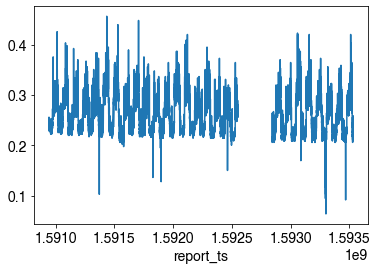

In [21]:
# Calculate utilization of PM's CPU

# Find all the VMs running on a particular PM
vm = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM.csv")
vm_cpu_shanghai = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_CPU_shanghai.csv")
pm_df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/PM.csv")

vm_cpu_shanghai = vm_cpu_shanghai.merge(vm[["vm_id", "pm_name","cores","memory","storage"]], on="vm_id", how="left")
vm_cpu_shanghai = vm_cpu_shanghai.merge(pm_df[["pm_name", "cores"]], on="pm_name", how="left", suffixes=(None, "_pm"))
vm_cpu_shanghai = vm_cpu_shanghai[vm_cpu_shanghai.cores_pm != 0]
vm_cpu_shanghai["cpu_used"] = vm_cpu_shanghai["cpu_rate"] * vm_cpu_shanghai["cores"] / vm_cpu_shanghai["cores_pm"]

new_df = vm_cpu_shanghai.groupby(["report_ts","pm_name"]).cpu_used.sum().unstack()

print(new_df.mean().sort_values())

new_df['0ccee47db9a78675d35488d07bbdba81'].plot.line()

# Plot memory utilization

In [101]:
def calc_euclidean(vals1, vals2):
    return np.linalg.norm(vals1 - vals2)
    #return np.sqrt(np.sum((vals1 - vals2) ** 2))


Standardized time series:


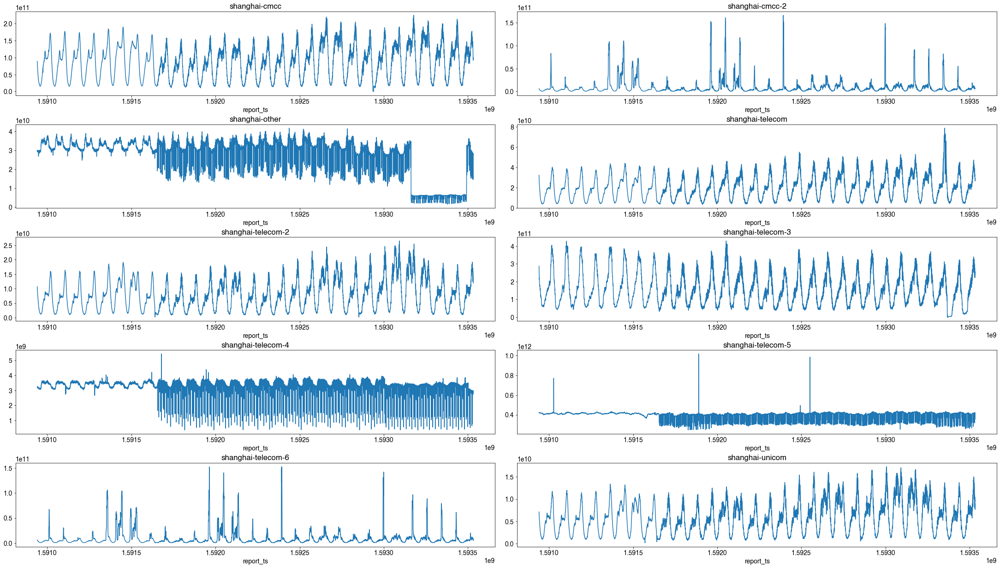

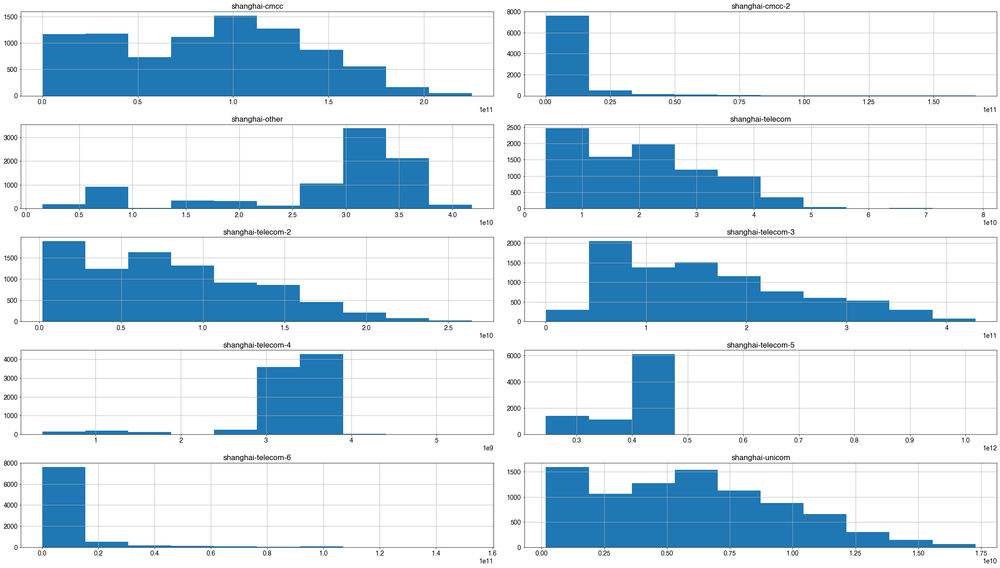

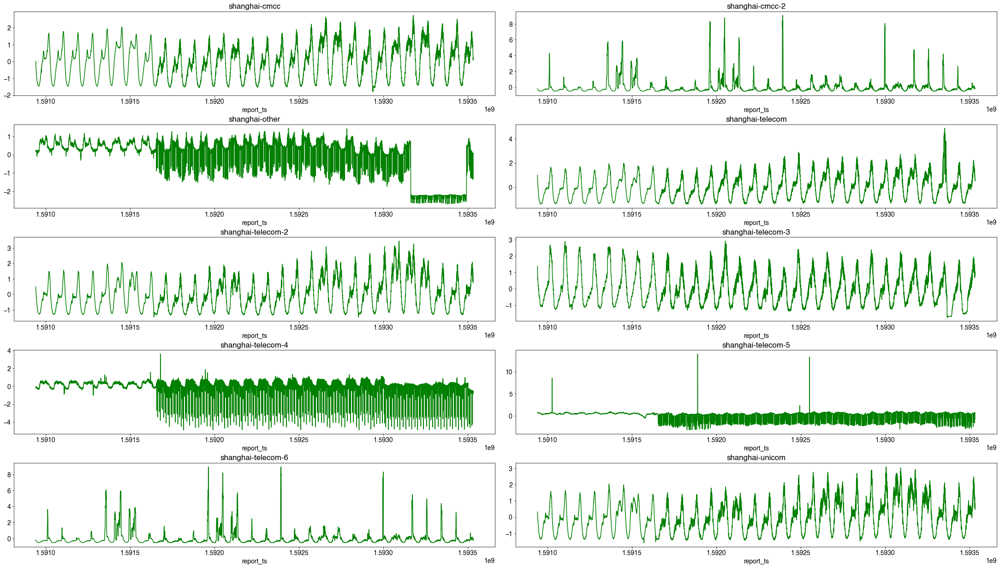

In [85]:
# First attempt at quantifying differences between time series

cities = ["shanghai"]

for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    #print(df.groupby(["report_ts", "site_id"]).pub_up_flow.sum())#.plot(ax=ax)
    new_df = df.groupby(["report_ts", "site_id"]).pub_up_flow.sum().unstack()
    column_names = new_df.columns.tolist()

    fig, axs = plt.subplots(5, 2, figsize=(30, 17), constrained_layout=True)
    for col, ax in zip(column_names, axs.flat):
        new_df[[col]].plot.line(title=col, ax=ax, legend=False)

    fig, axs2 = plt.subplots(5, 2, figsize=(30, 17), constrained_layout=True)
    for col, ax2 in zip(column_names, axs2.flat):
        new_df[[col]].hist(ax=ax2, legend=False)

    scaled_cols = StandardScaler().fit_transform(new_df.values)
    scaled_df = pd.DataFrame(scaled_cols, index=new_df.index, columns=new_df.columns)

    print("\nStandardized time series:")
    fig3, axs3 = plt.subplots(5, 2, figsize=(30, 17), constrained_layout=True)
    for col, ax3 in zip(column_names, axs3.flat):
        scaled_df[[col]].plot.line(title=col, ax=ax3, legend=False, color='g')
    #scaled_df.plot.line(figsize=(15,13), title=city)


In [48]:
cities = ["wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

dfs = []
for city in cities:
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    new_df = df.groupby('report_ts', as_index=False).pub_up_flow.sum().rename(columns={'pub_up_flow' : city})
    new_df = new_df.set_index('report_ts')
    dfs.append(new_df.copy())

    #scaled_vals[city] = StandardScaler().fit_transform(new_df.values.reshape(len(new_df), 1)).reshape((-1,len(new_df)))[0]
pub_up_flows_cities = pd.concat(dfs, axis=1)

scaled_columns = StandardScaler().fit_transform(pub_up_flows_cities.values)
pub_up_flows_cities_scaled = pd.DataFrame(scaled_columns, index=pub_up_flows_cities.index, columns=pub_up_flows_cities.columns)

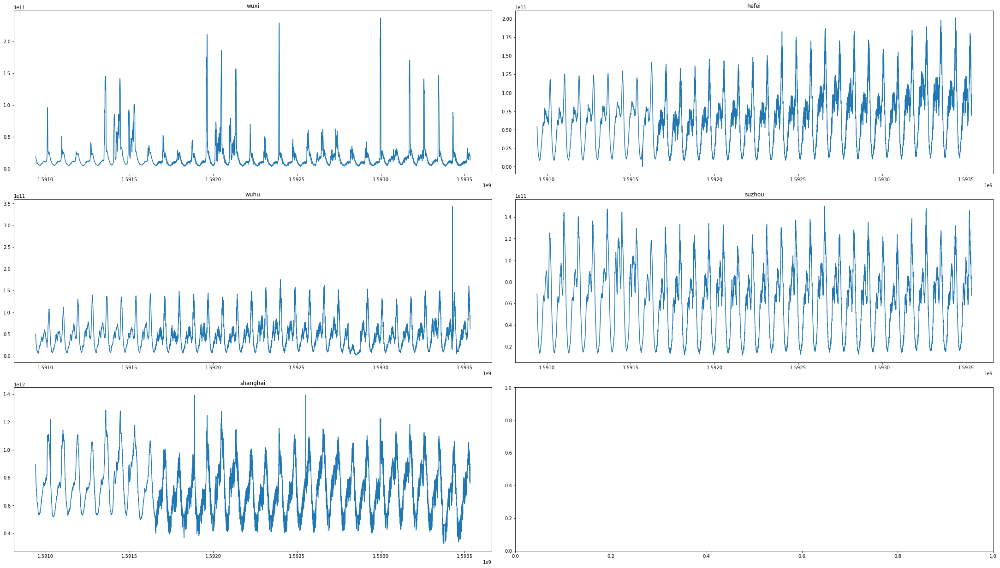

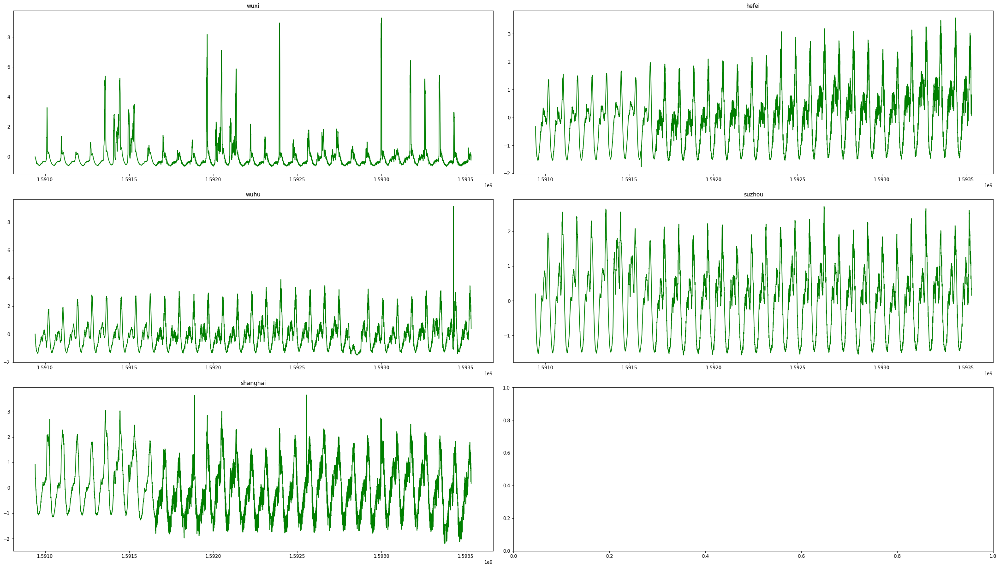

In [49]:
cities = ["wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

fig1, axs1 = plt.subplots(3, 2, figsize=(30, 17), constrained_layout=True)
fig2, axs2 = plt.subplots(3, 2, figsize=(30, 17), constrained_layout=True)
scaled_vals = {}
orig_vals = {}
time_vals = []
for city, ax1, ax2 in zip(cities, axs1.flat, axs2.flat):
    df = pd.read_csv(DATASET_LOCATION.rstrip("/") + "/VM_BANDWIDTH_{}.csv".format(city))
    df.sort_values(by='report_ts', inplace=True)
    new_df = df.groupby('report_ts').pub_up_flow.sum()
    orig_vals[city] = new_df.values.flatten().tolist()
    ax1.set_title(city)
    ax1.plot(new_df.index, new_df.values)

    if len(time_vals) == 0:
        time_vals = new_df.index.tolist()

    scaled_vals[city] = StandardScaler().fit_transform(new_df.values.reshape(len(new_df), 1)).reshape((-1,len(new_df)))[0]
    ax2.set_title(city)
    ax2.plot(new_df.index, scaled_vals[city], color='g')

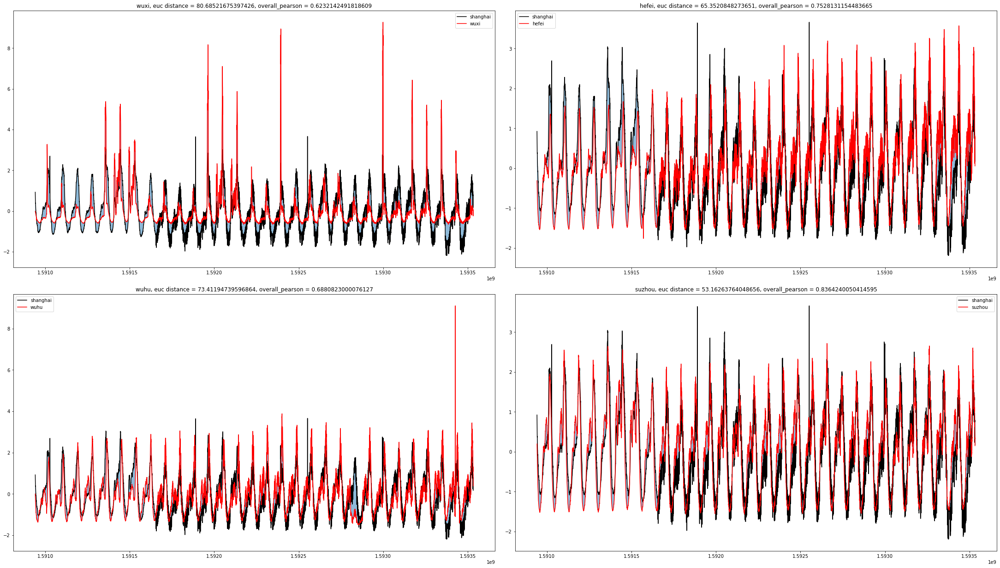

In [50]:
# Plot euclidean distance between Shanghai and other cities
# Removing changzhou - as it doesn't have sufficient data in RTT or VM dataset (only 8 VMs deployed)
cities = ["wuxi", "hefei", "wuhu", "suzhou"]

fig, axs = plt.subplots(2,2, figsize=(30, 17), constrained_layout=True)
for city, ax in zip(cities, axs.flat):
    euc_dist = np.linalg.norm(pub_up_flows_cities_scaled["shanghai"]-pub_up_flows_cities_scaled[city])
    pearson_val, _ = stats.pearsonr(pub_up_flows_cities_scaled["shanghai"], pub_up_flows_cities_scaled[city])

    ax.set_title("{}, euc distance = {}, overall_pearson = {}".format(city, euc_dist, pearson_val))

    ax.plot(pub_up_flows_cities_scaled.index, pub_up_flows_cities_scaled["shanghai"], color='k', label="shanghai")
    ax.plot(pub_up_flows_cities_scaled.index, pub_up_flows_cities_scaled[city], color='r', label=city)
    ax.fill_between(pub_up_flows_cities_scaled.index, pub_up_flows_cities_scaled["shanghai"], pub_up_flows_cities_scaled[city], alpha=0.5)
    ax.legend()

In [51]:
pub_up_flows_cities_scaled.index = pd.to_datetime(pub_up_flows_cities_scaled.index, unit='s')
pub_up_flows_cities.index = pd.to_datetime(pub_up_flows_cities.index, unit='s')

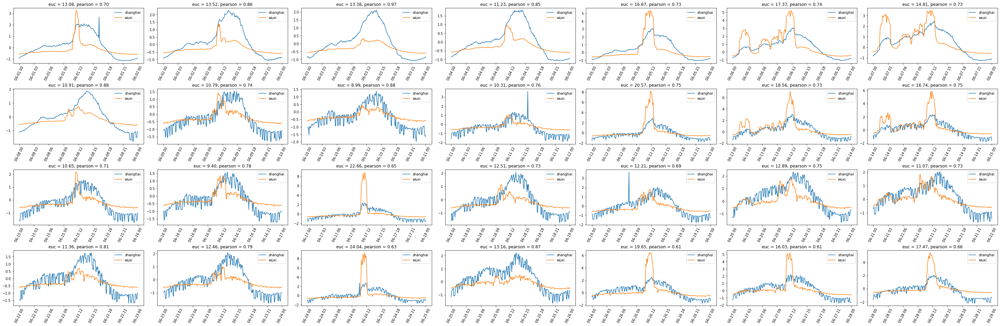

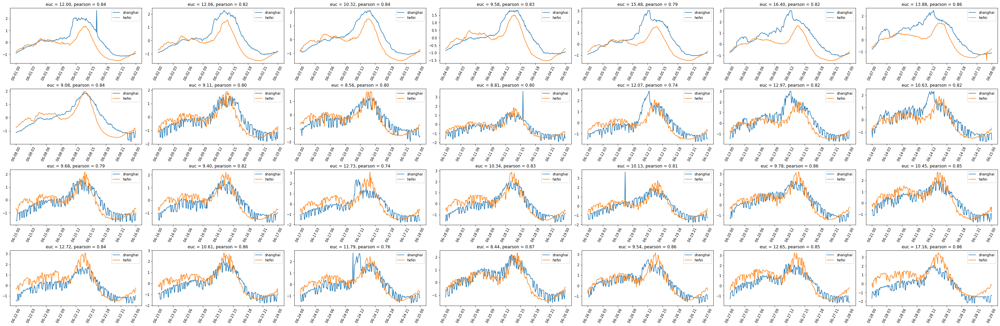

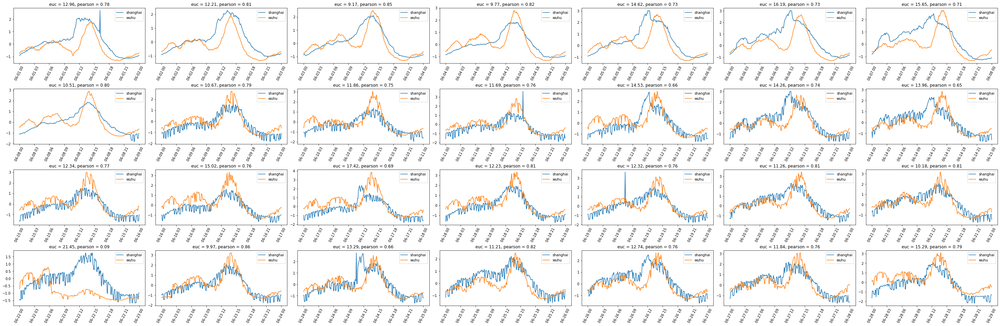

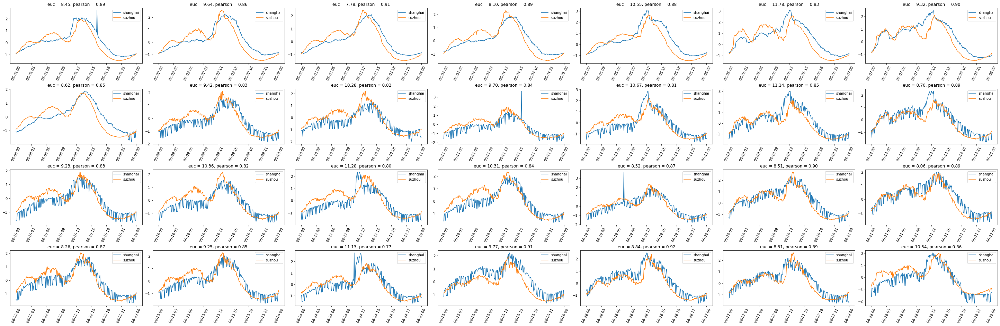

In [52]:
# Rolling window (one day) evaluation of similarity?

cities = ["wuxi", "hefei", "wuhu", "suzhou"]

dates = pd.date_range(start='2020-06-01', end='2020-06-30')

for city in cities:
    fig, axs = plt.subplots(4,7,figsize=(40, 13),constrained_layout=True)
    for idx, ax in zip(range(len(dates)-1), axs.flat):
        start_date = dates[idx]
        end_date = dates[idx+1]

        vals_shanghai = pub_up_flows_cities_scaled[start_date:end_date]["shanghai"].values
        vals_city = pub_up_flows_cities_scaled[start_date:end_date][city].values

        euc_dist = np.linalg.norm(vals_shanghai-vals_city)
        pearson_val, _ = stats.pearsonr(vals_shanghai, vals_city)

        ax.plot(pub_up_flows_cities_scaled[start_date:end_date].index, vals_shanghai, label='shanghai')
        ax.plot(pub_up_flows_cities_scaled[start_date:end_date].index, vals_city, label=city)
        ax.legend()
        ax.set_title("euc = {:.2f}, pearson = {:.2f}".format(euc_dist, pearson_val))
        for tick in ax.get_xticklabels():
            tick.set_rotation(63)

# Then evaluate similarity between workloads for similar applications

In [53]:
# Find common VM IDs between all sites
vm_complete_df = pd.read_csv(DATASET_LOCATION + "/VM.csv")
cities = ["wuxi", "hefei", "wuhu", "suzhou", "shanghai"]

dfs = []
for city in cities:
    vm_city_df = vm_complete_df.loc[vm_complete_df["site_id"].str.startswith(city)].copy()
    dfs.append(vm_city_df)
vm_df = pd.concat(dfs, ignore_index=True)
print(vm_df.columns)

# Remove VMs that are deployed in the PMs with CPU cores = 0  and memory = 0
vm_df_delete = vm_df[vm_df['pm_name'].isin(pm_ids_to_delete)]
vm_ids_to_delete = vm_df_delete.vm_id.to_list()

vm_df = vm_df[~vm_df['pm_name'].isin(pm_ids_to_delete)]
print("Number of VMs in chosen cities = {}".format(len(vm_df)))

vm_df_sites = vm_df["site_id"].str.split('-', expand=True)
vm_df_sites.rename(columns={0: "city", 1: "site_location", 2: "location_num"}, inplace=True)
vm_df_sites["location_num"] = vm_df_sites["location_num"].fillna(value=0)
vm_df = pd.concat([vm_df, vm_df_sites], axis=1)

Index(['vm_id', 'uid', 'pm_name', 'site_id', 'status', 'image_id', 'cores',
       'memory', 'storage', 'os_type', 'os_name', 'start_time', 'end_time'],
      dtype='object')
Number of VMs in chosen cities = 954


In [54]:
# According to paper, the largest edge app is a CDN application comprising nearly 1000 VMs
print("Number of VMs in the complete dataset")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(vm_complete_df.groupby(["uid"])["vm_id"].count().nlargest(10))


print("Number of VMs in the chosen cities, grouped by customer ID")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    groups_by_largest = vm_df.groupby(["uid"])["vm_id"].count().nlargest(11).reset_index()
    customer_ids = groups_by_largest.uid.tolist()

# Guessing that customer ID 80365 is a CDN application (with 959 VMs deployed, ~1000 as identified in the article)
# Removing 80365 from the list of customers
customer_ids.remove(80365)
print(customer_ids)

Number of VMs in the complete dataset
uid
80365    959
98051    743
52024    568
66394    350
64389    306
77787    282
89110    267
55644    232
15219    225
59604    211
Name: vm_id, dtype: int64
Number of VMs in the chosen cities, grouped by customer ID
[77787, 52024, 98051, 25295, 31102, 48776, 12347, 15301, 55644, 78131]


In [55]:
# Try to identify applications that are deployed in multiple cities
# Filter vm_df to only include largest 10 customers
dfs = []
for customer_id in customer_ids:
    sub_df = vm_df[vm_df["uid"]==customer_id].copy()
    dfs.append(sub_df)
vm_df = pd.concat(dfs, ignore_index=True)


# Count  number of unique cities where customers have deployed applications
print("Number of VMs deployed with same image id")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(vm_df.groupby(["uid", "image_id"])["city"].nunique().sort_values(ascending=False))

Number of VMs deployed with same image id
uid    image_id                        
55644  3193fad04c2288da16cda7e382b49e54    5
48776  e88966b6c37a76b158f415d091c7ab4c    5
77787  4690fc9b86e18b9d212325e61d7d3b06    4
55644  589b0cb20a915ccd16df6b4476e648d5    4
48776  90ca88e83659fce069bcdf163c9227eb    3
12347  a87bdf59592a2dad994df3543cc3bb82    3
       0aafcba5862b8308e5db4eae024da898    2
       eb9cfd079dfdd1d75f0772a8bcb87bf6    2
78131  3193fad04c2288da16cda7e382b49e54    2
52024  3193fad04c2288da16cda7e382b49e54    2
       30d07636878f68ffaa7afcb8e692272b    1
98051  c6500102b1bf6bc3c6d5b246973cefc5    1
       b6039c7325c4af5fbaa21c24c154c06a    1
78131  589b0cb20a915ccd16df6b4476e648d5    1
       43b047b4f2ab6abf5a05f236e2c8eb59    1
48776  d2c997b19a803e76b702ca562b2de005    1
       376125ed6c48d94156aae61efbe23cc0    1
31102  5f6119ba9e4cb25bfb7c203658a7b783    1
       589b0cb20a915ccd16df6b4476e648d5    1
25295  d1f9255f9f001709c04c3626408b7fdf    1
       75c344ab579

In [43]:

def plot_cpu_bw_rates(customer_id, image_id):
    vm_ids = vm_df[(vm_df["uid"]==customer_id) & (vm_df["image_id"]==image_id)].vm_id.to_list()
    num_vm_ids = len(vm_ids)
    fig, axs = plt.subplots(num_vm_ids,3,figsize=(40, 70),constrained_layout=True)

    for vm_idx in range(num_vm_ids):
        vm_id = vm_ids[vm_idx]
        city_name = vm_df[vm_df["vm_id"]==vm_id].city.values[0]
        print(vm_id, city_name)
        vm_bw_df = pd.read_csv(DATASET_LOCATION + "/VM_BANDWIDTH_{}.csv".format(city_name))
        sub_df = vm_bw_df[vm_bw_df["vm_id"]==vm_id].copy()
        if len(sub_df) > 0:
            sub_df.sort_values(by='report_ts', inplace=True)
            #fig, ax = plt.subplots(figsize=(10,7))
            axs[vm_idx][0].plot(sub_df.report_ts, sub_df.pub_down_flow)
            axs[vm_idx][1].plot(sub_df.report_ts, sub_df.pub_up_flow)
            axs[vm_idx][0].set_title("VM_ID = {}, site ID = {}, pub_down_flow".format(vm_id, sub_df.site_id.values[0]))
            axs[vm_idx][1].set_title("VM_ID = {}, site ID = {}, pub_up_flow".format(vm_id, sub_df.site_id.values[0]))

        vm_cpu_df = pd.read_csv(DATASET_LOCATION + "/VM_CPU_{}.csv".format(city_name))
        sub_df = vm_cpu_df[vm_cpu_df["vm_id"]==vm_id].copy()
        if len(sub_df) > 0:
            sub_df.sort_values(by='report_ts', inplace=True)
            axs[vm_idx][2].plot(sub_df.report_ts, sub_df.cpu_rate)
            axs[vm_idx][2].set_title("VM_ID = {}, site ID = {}, cpu_rate".format(vm_id, sub_df.site_id.values[0]))

f4f8e1c19cf352a1f0e358fb1e7dfae3 wuxi
ed16483fa09cda76da00b7234e72bfa2 wuxi
7860b509ee7b8ce839b480f071316323 hefei
62558d26761e111e698f45547e977dc4 wuhu
2b469da0f522b6839f97e1fd067b1da8 wuhu
63852f5f408392a2291bd3feab6d2bc4 wuhu
e9d97ec56e83d613f100ee47d1efb569 wuhu
09c598fcd9c4b88821a8c626611a7b23 suzhou
80b6b4bbec006bc6de079e168747b932 suzhou
758b3fe34fe13271f9f240988b927d97 suzhou
53d228143f1aae9253b9fc9b78d6cc33 shanghai
da416c8953830e3b296036a27379b373 shanghai
fedd66a4fa355a36a912061f1f893996 shanghai
0f39e6fb51c5b691e480a6abb2e74948 shanghai
311df5072cca0bb76a97424f24d1fb49 shanghai
0a6e3449b0604c85b8623e0105a878a4 shanghai
c7dafff75b710817fcabe76a8c3d36d4 shanghai
585707d8541e0968df3e897f2660b41a shanghai


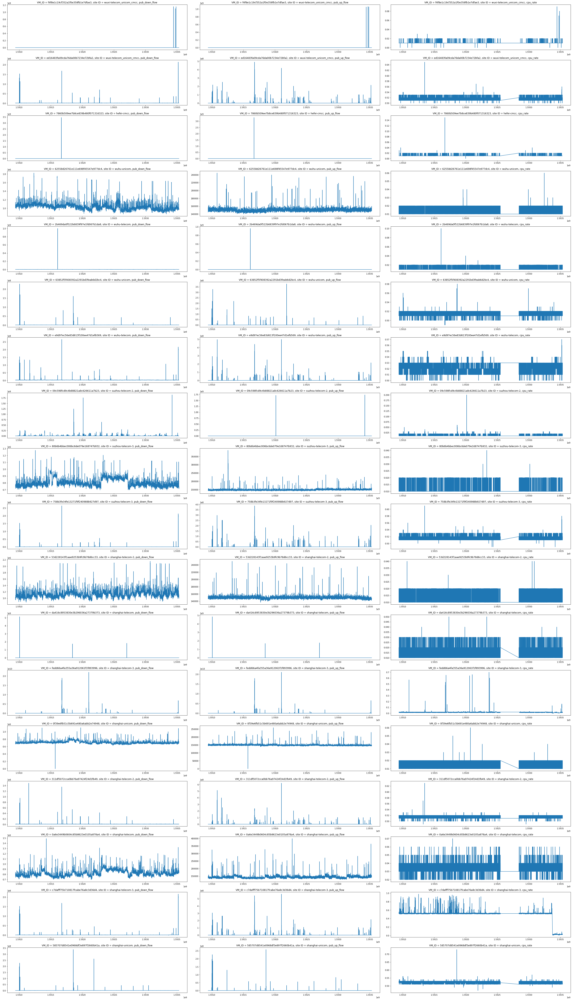

In [44]:
# Top customer ID 55644 with image ID 3193fad... deployed in 5 cities
plot_cpu_bw_rates(55644, "3193fad04c2288da16cda7e382b49e54")

440dd04c1af0505e384bfbc125eedf05 wuxi
c1ca372eba1a007afda235f620b89168 wuxi
996f6a71c7fe870458c3d7116c8b3610 hefei
daf8b7815cca038b5b09ed441e9cc74d wuhu
2dbd3dd2425e821b2622e729bb91591c wuhu
bc39d2bd9910ffdc1dcbbce890b2ad41 suzhou
dfd55427c3ca0e033fafcf6d18cb5e5e suzhou
0cc3a69836c4bc2d810df818da8c3eba shanghai
242bd9de11644b138b421704535cfa9b shanghai
a259e21d2e8a4556dc6f008873bf8f04 shanghai
a1f8e63b9d02369abb75db6ee46b202b shanghai
5e2c435fcf5ed11c265b3e6e2200524e shanghai
d54b89bda62a1e2680a4ced9a2a49eb2 shanghai
d0422bcbf5232faba9255ba62cb0bd00 shanghai
7d109ff4c3c41695315aeefa9f6eda98 shanghai
0dd49de3f51ac0d0f2003afbc7de7e1c shanghai
54563b98d1688ffbecc449ec9ce86cb0 shanghai
c0483f1e6d47a77d134611a77a5b2714 shanghai


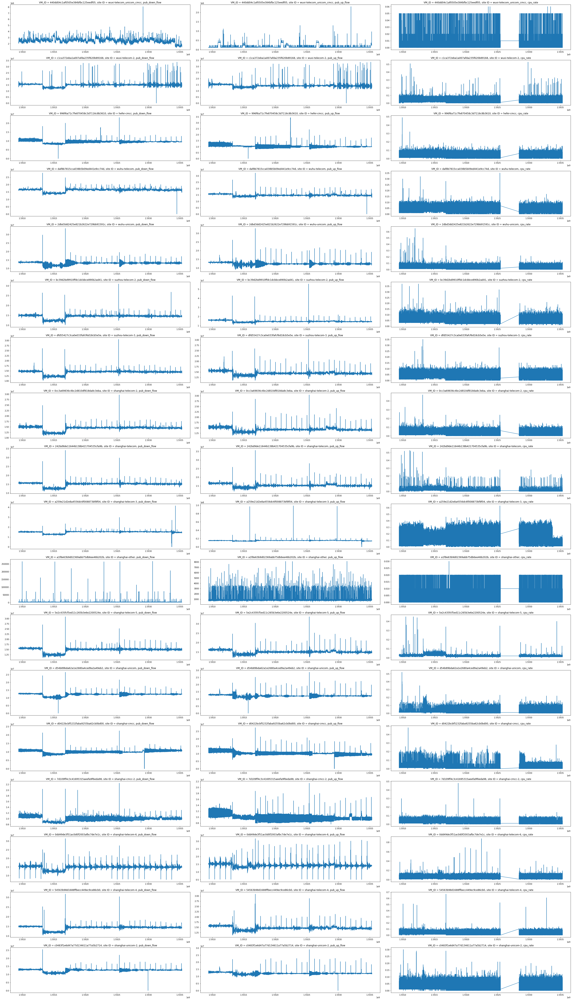

In [45]:
plot_cpu_bw_rates(48776, "e88966b6c37a76b158f415d091c7ab4c")

In [56]:
plot_cpu_bw_rates(77787, "4690fc9b86e18b9d212325e61d7d3b06")

b0c2f2b93ca26ba41a3d868cbcebe14a hefei
44e68d4dfb4dcd2fe3d492d70c8e0cd1 wuhu
768435a92a49b0691d4fb3bc02efe889 wuhu
4a3ebe7eab23c01018819150066fbeb3 suzhou
3676ad53cc0462b11c43dae801fbeb70 suzhou
659293e561f246d42e1f66ecd2a4e62c shanghai
3448b29bd6d42a132658a1388f303a3f shanghai
e37429e4753f45ba87ebb0228bf9259d shanghai
0fed361cff6119b324a8ae79792bf5d2 shanghai
6ab2686f2bbbda359e715e6aea3d6489 shanghai
6412f9752a7886e017199cb1c5e2f3c3 shanghai
aa26d6147af50570e451289042529181 shanghai
b44b246283d3e09c99102af589a13b6d shanghai
0d95c6f3043c7d0208e48ec80983246a shanghai
55deedfe20492ef9ee10b5f082782947 shanghai
dbec6bd7522e7d8f3f59a613c878d0eb shanghai
ba2b2e64d68c704fd7c7a2c12b6b8b21 shanghai
e54656e2f14a1c116fb0c9b08b4e9fca shanghai
cb85ed1ca04d252b51c0bc25e0698c27 shanghai
5309bbe0b8f97c5229845391264a2667 shanghai
dcee2f2d5d4aaf77afee02becff78acd shanghai
8f2fedf0cf6b52f8557304fd9bc9b80b shanghai
f034cd0a1c61a942f5d88253406eb9b6 shanghai
a3b11f3695e08a2ba1831836bd167a31 shanghai
b971039

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

Error in callback <function flush_figures at 0x117e5c0d0> (for post_execute):



KeyboardInterrupt

